In [ ]:
import numpy as np
from PIL import Image
from pathlib import Path
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import patches
from scipy.fft import fft2, fftshift
import dm4
import csv

# Reading the dm4 file
def read_dm4_to_array(dm4_path: Path) -> np.ndarray:
    """Read DM4 image -> 2D array (uint16 if possible)."""
    with dm4.DM4File.open(str(dm4_path)) as f:
        tags   = f.read_directory()
        imdata = tags.named_subdirs['ImageList'].unnamed_subdirs[1].named_subdirs['ImageData']
        XDim   = f.read_tag_data(imdata.named_subdirs['Dimensions'].unnamed_tags[0])
        YDim   = f.read_tag_data(imdata.named_subdirs['Dimensions'].unnamed_tags[1])
        raw    = np.array(f.read_tag_data(imdata.named_tags['Data']))
        arr    = raw.reshape((YDim, XDim))
    return arr if arr.dtype == np.uint16 else arr.astype(np.uint16)

# Finding the dm4 files in given folder
def find_dm4_files(folder: Path, recursive: bool = False):
    pattern = "**/*.[dD][mM]4" if recursive else "*.[dD][mM]4"
    return sorted(folder.glob(pattern))

# Styling the figures
def apply_matplotlib_style(cfg):
    mpl.rcParams.update({
        "figure.figsize": cfg["figsize_in"],
        "figure.dpi": cfg["dpi"],
        "font.family": cfg["font_family"],
        "axes.titlesize": cfg["title_size"],
        "axes.linewidth": cfg["axes_linewidth"],
        "savefig.bbox": "tight",
        "savefig.pad_inches": cfg["savefig_pad_inches"],
        "xtick.labelsize": cfg["cbar_tick_size"],
        "ytick.labelsize": cfg["cbar_tick_size"],
    })

# Adjust visuals for raw data 
def percentile_stretch(img, p_low=1, p_high=99):
    lo, hi = np.percentile(img, [p_low, p_high])
    if hi <= lo:
        hi = lo + 1
    return np.clip((img.astype(np.float64) - lo) / (hi - lo), 0, 1)

# Add scalebar
def add_scalebar(ax, nm_per_pixel,
                 target_frac=0.25, height_frac=0.012,
                 color="white", pad_px=10, label=True, fontsize=9):
    """Add scale bar (nm or µm) at bottom-left."""
    if nm_per_pixel is None:
        return
    im = ax.images[0]
    h, w = im.get_array().shape
    px_target = w * target_frac
    nm_target = px_target * nm_per_pixel

    base = 10 ** np.floor(np.log10(nm_target))
    for mult in [1, 2, 5, 10]:
        nm_len = mult * base
        if nm_len >= nm_target * 0.6:
            break
    px_len = nm_len / nm_per_pixel

    label_val, unit = (nm_len, "nm")
    if label_val >= 1000:
        label_val /= 1000.0
        unit = "µm"
    label_text = f"{int(label_val) if float(label_val).is_integer() else label_val:g} {unit}"

    bar_h = h * height_frac
    x0, y0 = pad_px, h - pad_px
    rect = patches.Rectangle((x0, y0 - bar_h), px_len, bar_h, linewidth=0, facecolor=color)
    ax.add_patch(rect)
    if label:
        ax.text(x0 + px_len/2, y0 - bar_h - 6, label_text,
                ha="center", va="bottom", color=color, fontsize=fontsize)

# Save dm4 files as tif files
def save_tif(img, out_path: Path):
    out_path.parent.mkdir(parents=True, exist_ok=True)
    Image.fromarray(img, mode="I;16").save(out_path)

# Plotting 
def plot_raw(img, title, cfg, save_path=None):
    disp = percentile_stretch(img, cfg["percentile_low"], cfg["percentile_high"])
    fig, ax = plt.subplots()
    im = ax.imshow(disp, cmap=cfg["raw_cmap"], interpolation="nearest")
    ax.set_title(title)
    ax.axis("off")
    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.03)
    cbar.set_label("Normalized intensity", fontsize=cfg["cbar_label_size"])
    cbar.ax.tick_params(labelsize=cfg["cbar_tick_size"])
    if cfg["show_scalebar"] and cfg["nm_per_px"] is not None:
        add_scalebar(ax, cfg["nm_per_px"], fontsize=9)
    if save_path is not None:
        save_path.parent.mkdir(parents=True, exist_ok=True)
        fig.savefig(save_path)
    if cfg["show_inline"]:
        plt.show()
    else:
        plt.close(fig)

def plot_fft(img, title, cfg, save_path=None):
    F = fftshift(fft2(img.astype(np.float64)))
    mag = np.abs(F)
    disp = np.log1p(mag)
    disp /= disp.max() if disp.max() > 0 else 1
    fig, ax = plt.subplots()
    im = ax.imshow(disp, cmap=cfg["fft_cmap"], interpolation="nearest")
    ax.set_title(f"{title} (FFT)")
    ax.axis("off")
    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.03)
    cbar.set_label("log magnitude", fontsize=cfg["cbar_label_size"])
    cbar.ax.tick_params(labelsize=cfg["cbar_tick_size"])
    if save_path is not None:
        save_path.parent.mkdir(parents=True, exist_ok=True)
        fig.savefig(save_path)
    if cfg["show_inline"]:
        plt.show()
    else:
        plt.close(fig)

# Fully process each file from dm4 to tif to figures
def process_one_file(dm4_path: Path, cfg, out_root: Path):
    prefix = dm4_path.stem
    arr = read_dm4_to_array(dm4_path)

    # Save raw TIF
    if cfg["save_outputs"]:
        save_tif(arr, out_root / "tif" / f"{prefix}.tif")

    # Figures
    plot_raw(
        arr, prefix, cfg,
        save_path=(out_root / "figures" / "raw" / f"{prefix}.png") if cfg["save_outputs"] else None
    )
    plot_fft(
        arr, prefix, cfg,
        save_path=(out_root / "figures" / "fft" / f"{prefix}.png") if cfg["save_outputs"] else None
    )

# Process the entire batch of files
def run_batch(cfg):
    apply_matplotlib_style(cfg)

    folder = cfg["folder"]
    out_root = folder / cfg["output_dirname"]
    dm4_files = find_dm4_files(folder, cfg["recursive"])

    if not dm4_files:
        print("No DM4 files found in:", folder)
        return

    for i, p in enumerate(dm4_files, 1):
        print(f"[{i}/{len(dm4_files)}] {p.stem}")
        try:
            process_one_file(p, cfg, out_root)
        except Exception as e:
            print(f"  Error on {p.name}: {e}")

    print("Saved to:" if cfg["save_outputs"] else "Displayed", out_root if cfg["save_outputs"] else "")


In [ ]:
CONFIG = {
    # --- Paths ---
    "folder": Path("TEM_Example/TEM_toy_data_MoSe2_2024"),  # folder with .dm4 files
    "recursive": False,              # search subfolders if needed
    "output_dirname": "exports",     # folder where output files are saved

    # --- What to do ---
    "show_inline": True,             # display figures in the notebook
    "save_outputs": False,           # save 16-bit TIF and PNG figures

    # --- Scale bar (set nm_per_px to enable) ---
    "nm_per_px": None,               # e.g., 0.050  (nm per pixel)
    "show_scalebar": True,

    # --- Display transform (RAW only) ---
    "percentile_low": 1.0,           # percentile stretch for nicer display
    "percentile_high": 99.0,

    # --- Plot style ---
    "raw_cmap": "magma", 
    "fft_cmap": "viridis",           
    "figsize_in": (4, 4), # inches
    "dpi": 300,
    "font_family": "DejaVu Sans",
    "title_size": 10,
    "cbar_label_size": 9,
    "cbar_tick_size": 8,
    "axes_linewidth": 0.8,
    "savefig_pad_inches": 0.02,
}


[1/3] 200kV_100kX_OneView_0040


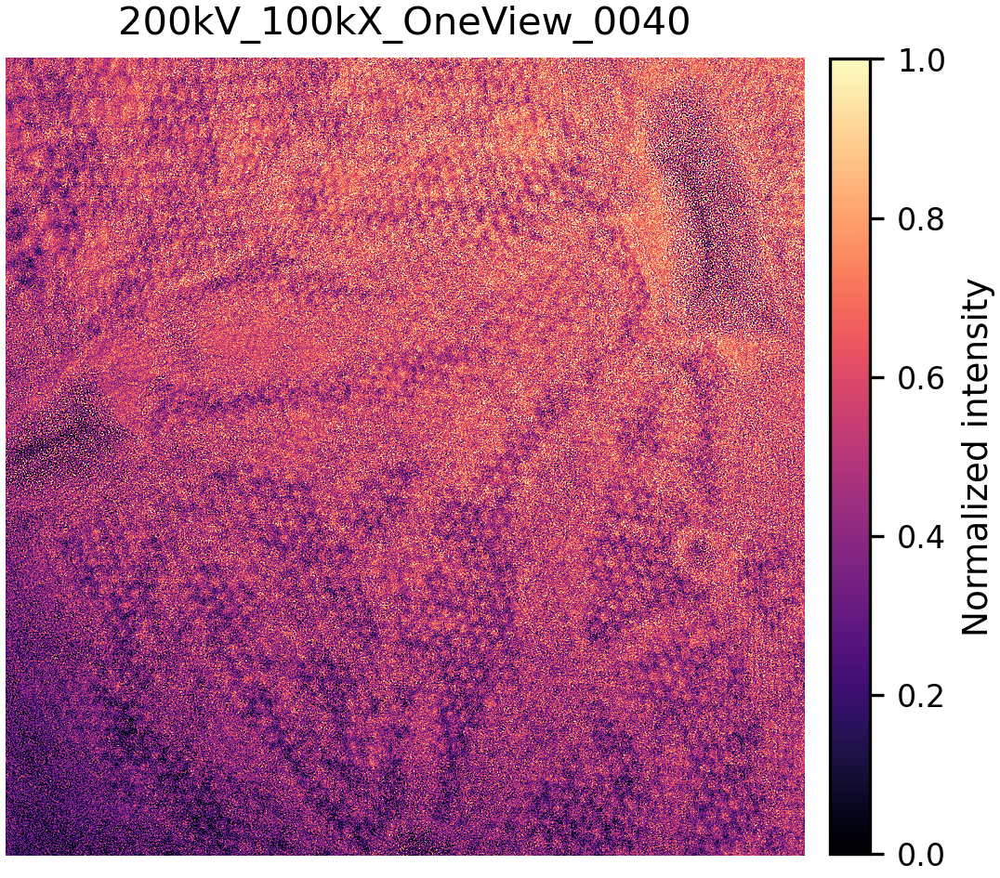

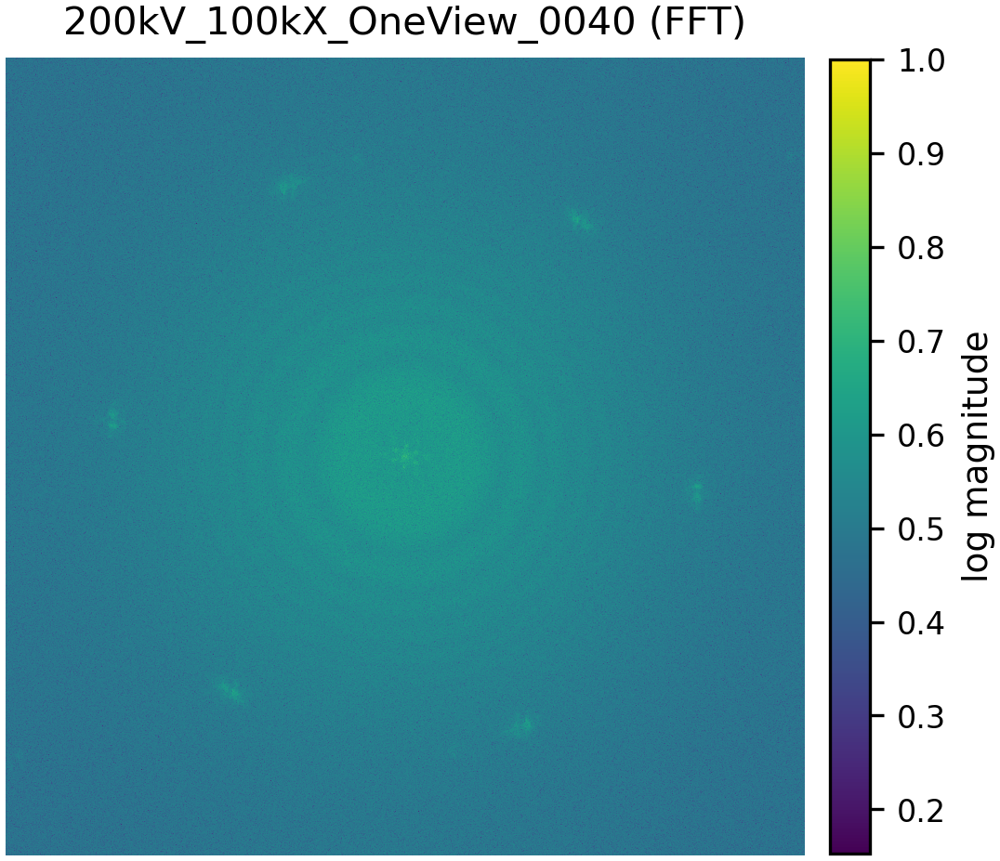

[2/3] 200kV_100kX_OneView_0043


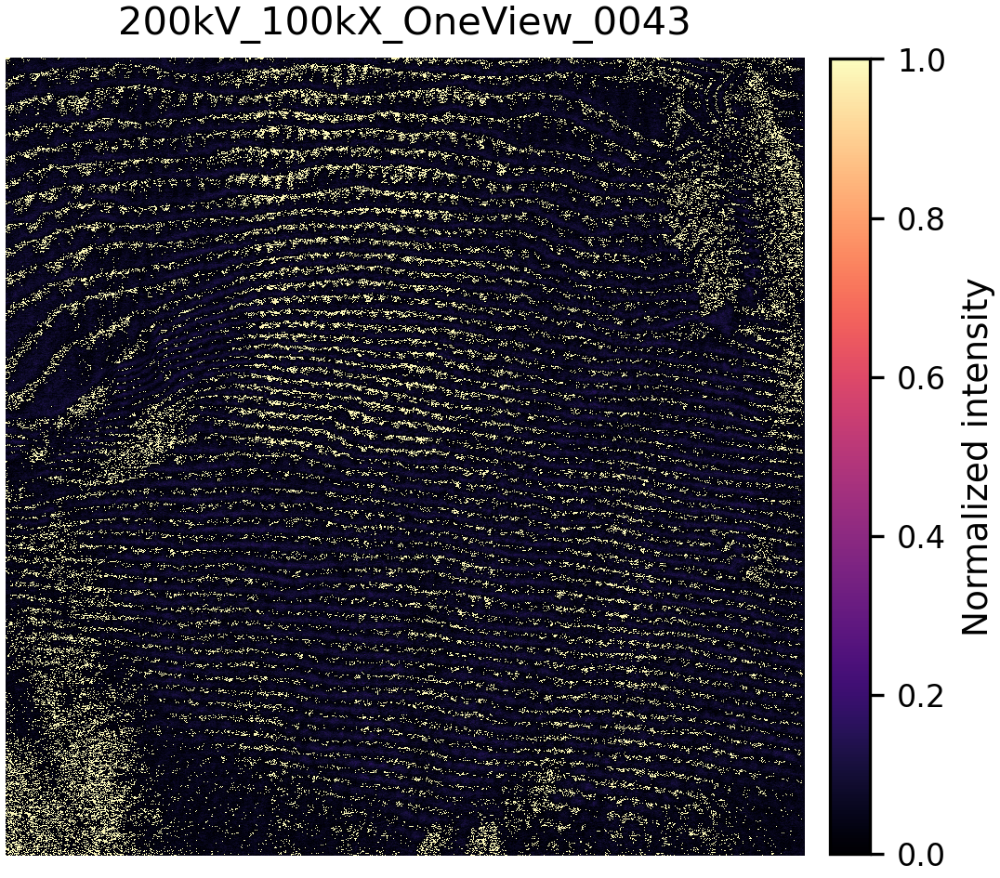

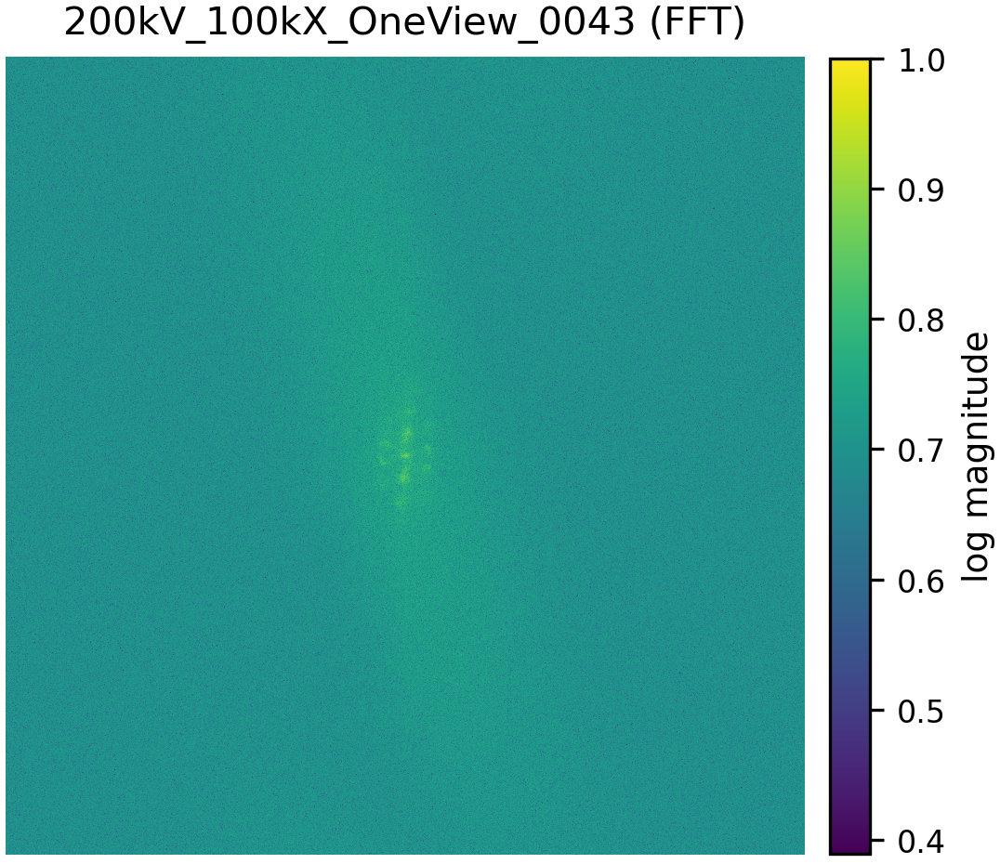

[3/3] 200kV_80kX_OneView_0044


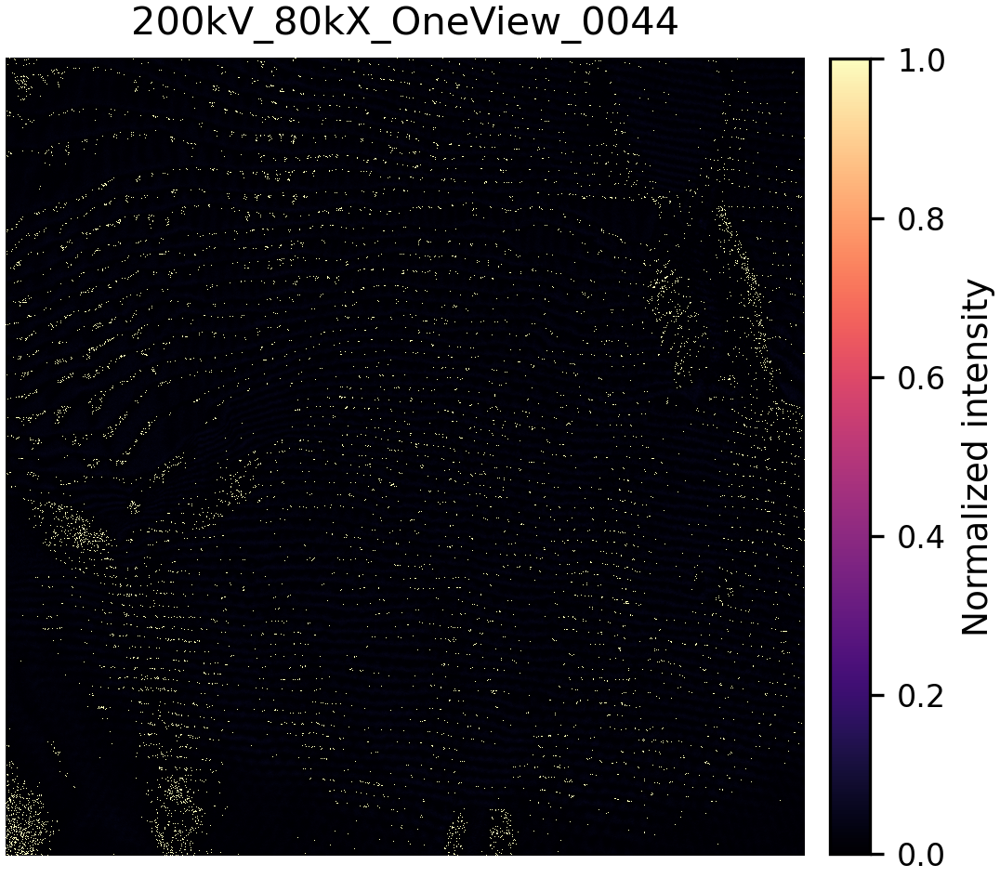

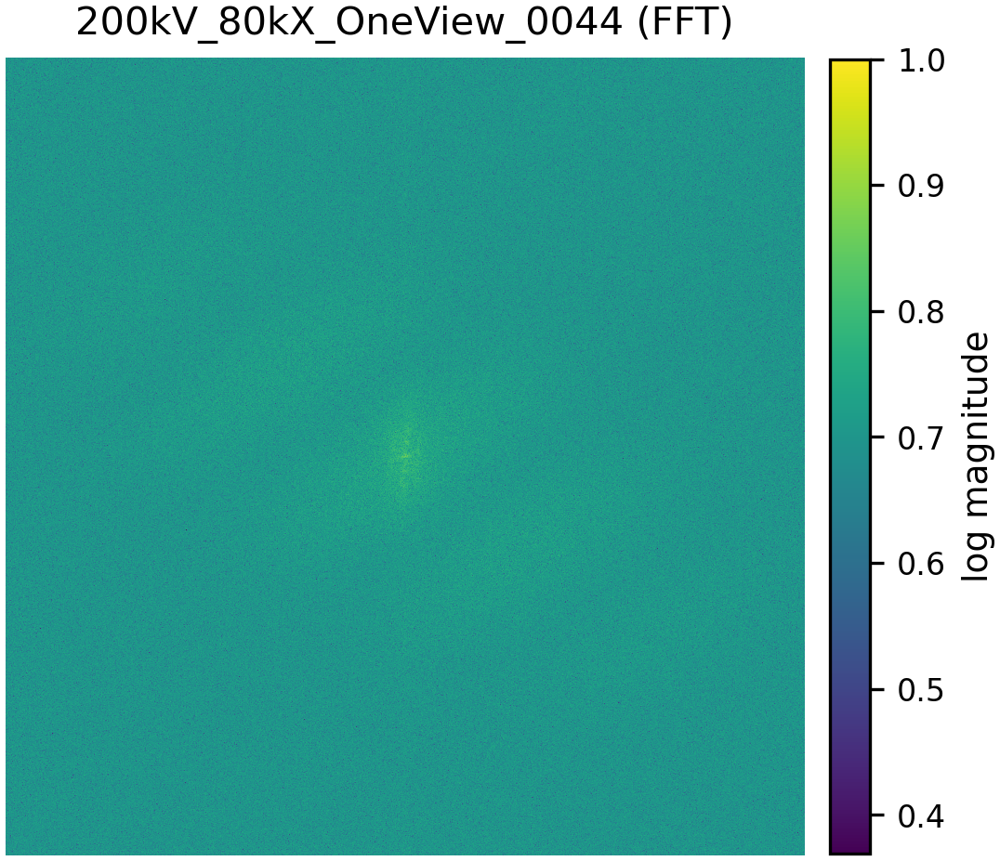

Displayed only. 


In [6]:
run_batch(CONFIG)
